In [1]:
!pip install scFates

  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
  Attempting uninstall: python-igraph
    Found existing installation: python-igraph 0.10.2
    Uninstalling python-igraph-0.10.2:
      Successfully uninstalled python-igraph-0.10.2

[notice] A new release of pip available: 22.3.1 -> 23.0.1
[notice] To update, run: pip install --upgrade pip


In [2]:
import sys
!{sys.executable} -m pip -q install palantir fa2


[notice] A new release of pip available: 22.3.1 -> 23.0.1
[notice] To update, run: pip install --upgrade pip


In [3]:
import warnings
warnings.filterwarnings("ignore")
from anndata import AnnData
import numpy as np
import pandas as pd
import scanpy as sc
import scFates as scf
import palantir
import matplotlib.pyplot as plt
sc.settings.verbosity = 3
sc.settings.logfile = sys.stdout
## fix palantir breaking down some plots
import seaborn
seaborn.reset_orig()
%matplotlib inline

sc.set_figure_params()
scf.set_figure_pubready()

findfont: Font family ['Raleway'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Lato'] not found. Falling back to DejaVu Sans.


In [274]:
adata

AnnData object with n_obs × n_vars = 50406 × 24264
    obs: 'stage', 'batch', 'leiden', 'CXCR4_labels', 'GOBPMIGR_labels'
    var: 'gene_ids', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'draw_graph', 'stage_colors', 'leiden', 'leiden_colors'
    obsm: 'X_pca', 'X_palantir', 'X_pca2d', 'X_draw_graph_fa'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [277]:
import scvelo as scv

In [278]:
loom1 = scv.read("/mnt/g/Aric_data_fetal_human/125d_ct/velocyto/125d_ct.loom", cache = True)
loom2 = scv.read("/mnt/g/Aric_data_fetal_human/125d_pp/velocyto/125d_pp.loom", cache = True)
loom3 = scv.read("/mnt/g/Aric_data_fetal_human/scdata/fetal/59d/velocyto/59d.loom", cache = True)
loom4 = scv.read("/mnt/g/Aric_data_fetal_human/scdata/fetal/82d_ct/velocyto/82d_ct.loom", cache = True)
loom5 = scv.read("/mnt/g/Aric_data_fetal_human/scdata/fetal/82d_pp/velocyto/82d_pp.loom", cache = True)

... writing an h5ad cache file to speedup reading next time
... writing an h5ad cache file to speedup reading next time
... writing an h5ad cache file to speedup reading next time
... writing an h5ad cache file to speedup reading next time
... writing an h5ad cache file to speedup reading next time


In [320]:
ldata = scv.read('/mnt/c/Users/Emil/10X/FD_adata_ldata.loom', cache = True)

... writing an h5ad cache file to speedup reading next time


In [287]:
loom3.obs_names_make_unique()
loom1.obs_names_make_unique()
loom2.obs_names_make_unique()
loom4.obs_names_make_unique()
loom5.obs_names_make_unique()

In [289]:
adatasubset

AnnData object with n_obs × n_vars = 5297 × 24264
    obs: 'stage', 'batch', 'leiden', 'GOBP_NEURON_MIGRATION', 'labels_CXCR4', 'labels_GOBP_NEURON_MIGR'
    var: 'gene_ids', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'draw_graph', 'stage_colors', 'leiden', 'leiden_colors', 'labels_CXCR4_colors', 'rank_genes_groups', 'labels_GOBP_NEURON_MIGR_colors', 'umap', 'tsne'
    obsm: 'X_pca', 'X_palantir', 'X_pca2d', 'X_draw_graph_fa', 'X_umap', 'X_tsne'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [291]:
import loompy

In [296]:
loompy.combine(["/mnt/g/Aric_data_fetal_human/125d_ct/velocyto/125d_ct.loom","/mnt/g/Aric_data_fetal_human/125d_pp/velocyto/125d_pp.loom","/mnt/g/Aric_data_fetal_human/scdata/fetal/59d/velocyto/59d.loom","/mnt/g/Aric_data_fetal_human/scdata/fetal/82d_ct/velocyto/82d_ct.loom","/mnt/g/Aric_data_fetal_human/scdata/fetal/82d_pp/velocyto/82d_pp.loom"], key="Accession", output_file = '/mnt/c/Users/Emil/10X/FD_adata_ldata.loom')

In [297]:
adatasubset_FD59 = adatasubset[adatasubset.obs['stage'].isin(['FD59'])]

In [298]:
adatasubset_FD59_loom = scv.utils.merge(adatasubset_FD59, loom3)

In [299]:
adatasubset_FD59

AnnData object with n_obs × n_vars = 2301 × 24264
    obs: 'stage', 'batch', 'leiden', 'GOBP_NEURON_MIGRATION', 'labels_CXCR4', 'labels_GOBP_NEURON_MIGR'
    var: 'gene_ids', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'draw_graph', 'stage_colors', 'leiden', 'leiden_colors', 'labels_CXCR4_colors', 'rank_genes_groups', 'labels_GOBP_NEURON_MIGR_colors', 'umap', 'tsne'
    obsm: 'X_pca', 'X_palantir', 'X_pca2d', 'X_draw_graph_fa', 'X_umap', 'X_tsne'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [308]:
adatasubset_FD59_loom.obs

,stage,batch,leiden,GOBP_NEURON_MIGRATION,labels_CXCR4,labels_GOBP_NEURON_MIGR,Clusters,_X,_Y,initial_size_spliced,initial_size_unspliced,initial_size,n_counts,velocity_self_transition
AAACATACTTCCAT,FD59,0,38,0.054293,Low CXCR4,Mid 80%,8,16.908585,-6.551699,5,5,5.0,79.007454,0.520993
AAACATACTTTCAC,FD59,0,38,0.018805,Mid CXCR4 80%,Mid 80%,2,-25.597639,-13.431974,198,50,198.0,85.204636,0.011185
AAACATTGACCTGA,FD59,0,24,0.062152,High CXCR4,Mid 80%,7,-3.144438,8.798876,149,45,149.0,88.472694,0.691047
AAACGCACCCGTAA,FD59,0,34,0.040064,Mid CXCR4 80%,Mid 80%,8,16.494774,-6.739455,100,26,100.0,92.003792,0.235188
AAACGCACGAGGAC,FD59,0,34,0.046655,Mid CXCR4 80%,Mid 80%,0,-4.046846,43.400078,130,35,130.0,88.205841,0.084985
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGACTGGGGACA,FD59,0,24,0.068492,High CXCR4,Mid 80%,0,-3.516865,29.168434,165,49,165.0,92.258484,0.147601
TTTGACTGGGGAGT,FD59,0,22,0.001124,Mid CXCR4 80%,Low,1,0.472992,-27.321653,220,60,220.0,89.304276,0.330112
TTTGACTGTGGTAC,FD59,0,38,0.049219,High CXCR4,Mid 80%,5,5.688320,-22.810453,183,31,183.0,88.441055,0.613362
TTTGCATGAATCGC,FD59,0,24,0.054983,Mid CXCR4 80%,Mid 80%,2,-21.352074,-12.332744,207,52,207.0,97.384026,0.138793


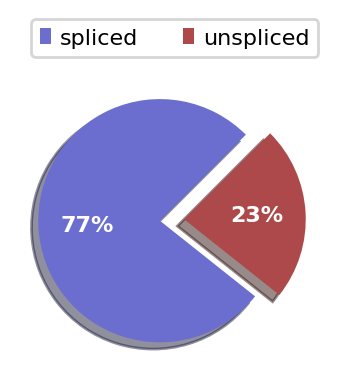

In [301]:
scv.pl.proportions(adatasubset_FD59_loom)

In [302]:
scv.pp.filter_and_normalize(adatasubset_FD59_loom, min_shared_counts=20, n_top_genes=2000)
scv.pp.moments(adatasubset_FD59_loom, n_pcs=30, n_neighbors=30)

Filtered out 17928 genes that are detected 20 counts (shared).
Normalized count data: spliced, unspliced.
Skip filtering by dispersion since number of variables are less than `n_top_genes`.
or is corrupted (e.g. due to subsetting). Consider recomputing with `pp.neighbors`.
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


In [303]:
scv.tl.velocity(adatasubset_FD59_loom)

computing velocities
The correlation threshold has been reduced to -0.0528.
Please be cautious when interpreting results.
    finished (0:00:00) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)


In [304]:
scv.pp.neighbors(adatasubset_FD59_loom)

computing neighbors
    finished (0:00:00) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)


In [305]:
scv.tl.velocity_graph(adatasubset_FD59_loom)

computing velocity graph (using 1/12 cores)


  0%|          | 0/2301 [00:00<?, ?cells/s]

    finished (0:00:04) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


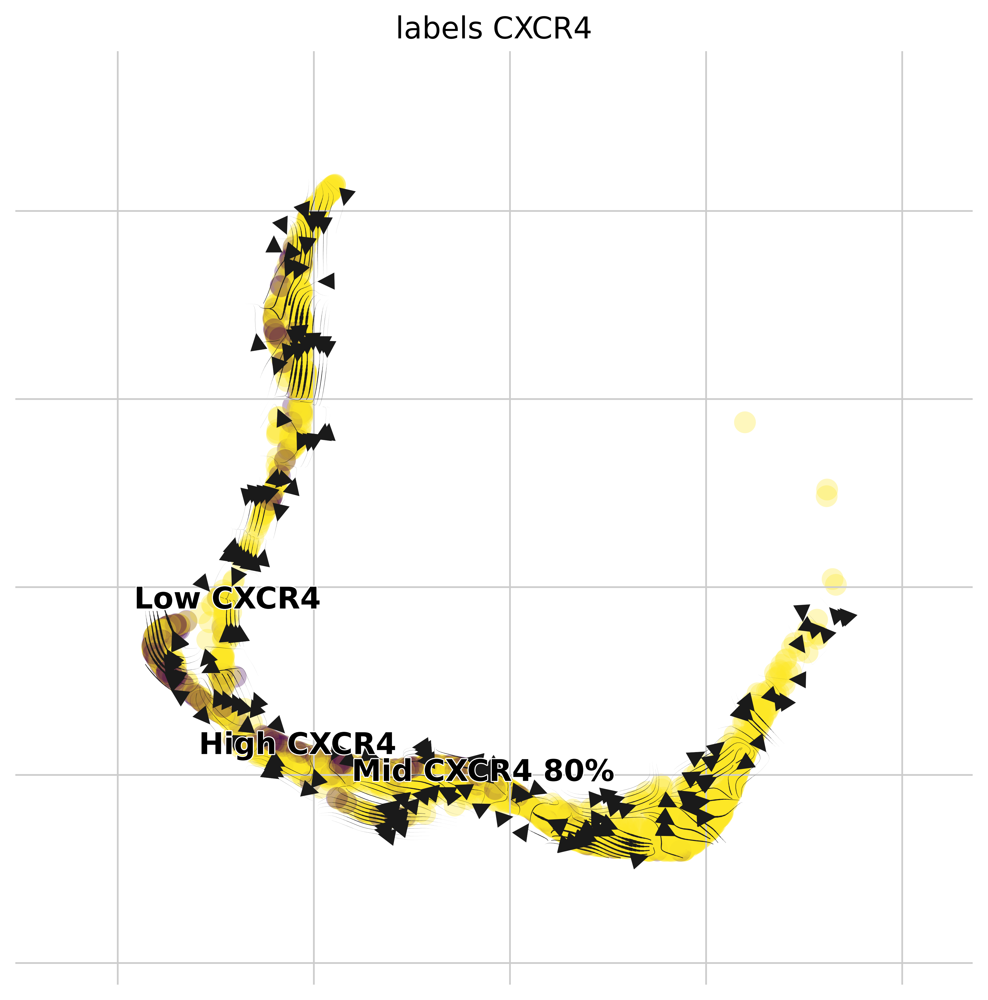

In [309]:
scv.pl.velocity_embedding_stream(adatasubset_FD59_loom, basis='draw_graph_fa', color = 'labels_CXCR4', dpi = 300, add_margin = 0.2, figsize = (8,8), arrow_size = 2, density = 6)

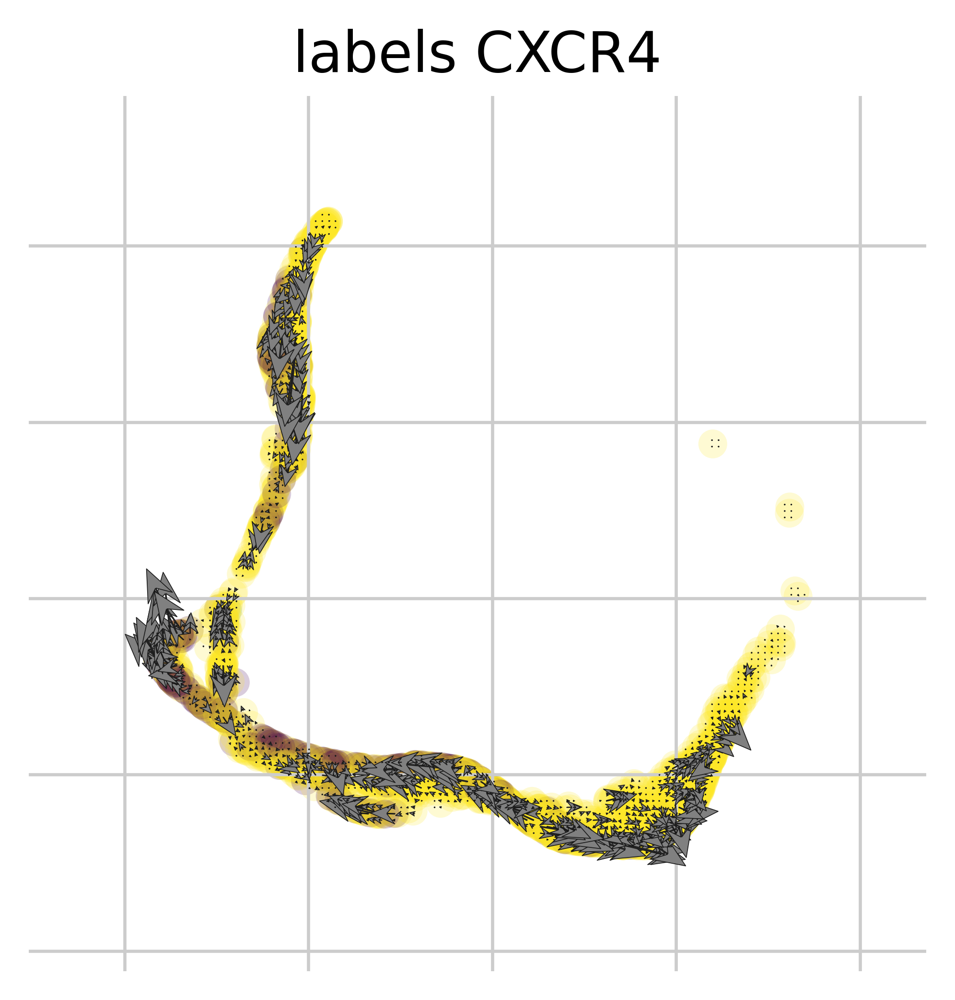

In [317]:
scv.pl.velocity_embedding_grid(adatasubset_FD59_loom, basis='draw_graph_fa', color = 'labels_CXCR4', dpi = 300, add_margin = 0.2, figsize = (4,4), arrow_length = 4, arrow_size = 6, density = 2)

In [334]:
def cluster_small_multiples_cartoon_RNAvelocity(
    adata, clust_key, size=40, frameon=False, legend_loc=None, **kwargs
):
    tmp = adata.copy()

    for i, clust in enumerate(adata.obs[clust_key].cat.categories):
        tmp.obs[clust] = adata.obs[clust_key].isin([clust]).astype("category")
        tmp.uns[clust + "_colors"] = ["#d3d3d3", adata.uns[clust_key + "_colors"][i]]

    with rc_context({'figure.figsize': (5, 5)}):
        scv.pl.velocity_embedding_grid(
            tmp,
            color=adata.obs[clust_key].cat.categories.tolist(),
            groups=tmp.obs[clust].cat.categories[1:].values,
            basis='draw_graph_fa',
            arrow_length = 4, arrow_size = 6, density = 2,
            add_margin = 0.2,
            legend_fontsize=12, legend_fontoutline=2,
            frameon=True,
            legend_loc=legend_loc, outline_width = [0.6,0.1],
            **kwargs,
        )
        
        #color=adata.obs[clust_key].cat.categories.tolist(),

In [337]:
enumerate(adatasubset.obs['labels_CXCR4'].cat.categories)

TypeError: 'bool' object is not iterable

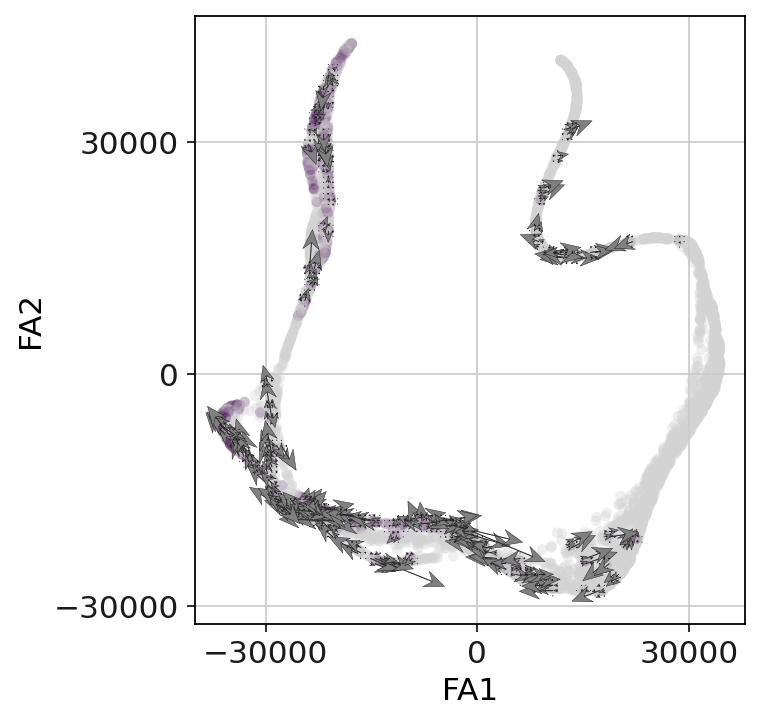

In [338]:
cluster_small_multiples_cartoon_RNAvelocity(adatasubset_loom, clust_key = 'labels_CXCR4')

In [324]:
adatasubset_loom = scv.utils.merge(adatasubset, ldata)

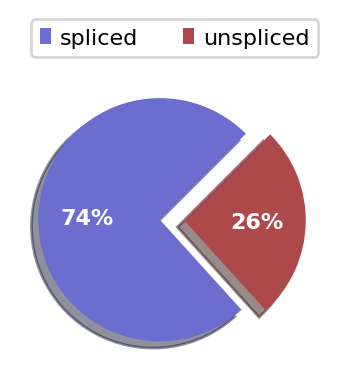

In [325]:
scv.pl.proportions(adatasubset_loom)

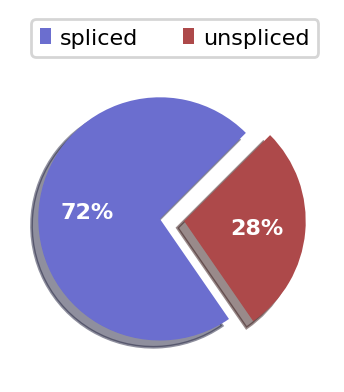

In [361]:
scv.pl.proportions(adatasubset_CXCR4low)

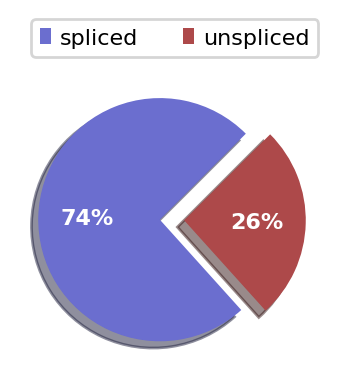

In [362]:
scv.pl.proportions(adatasubset_CXCR4high)

In [327]:
scv.pp.filter_and_normalize(adatasubset_loom, min_shared_counts=20, n_top_genes=2000)
scv.pp.moments(adatasubset_loom, n_pcs=30, n_neighbors=30)

Filtered out 17873 genes that are detected 20 counts (shared).
Normalized count data: spliced, unspliced.
Skip filtering by dispersion since number of variables are less than `n_top_genes`.
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


In [363]:
scv.pp.filter_and_normalize(adatasubset_CXCR4high, min_shared_counts=20, n_top_genes=2000)
scv.pp.moments(adatasubset_CXCR4high, n_pcs=30, n_neighbors=30)
scv.pp.filter_and_normalize(adatasubset_CXCR4low, min_shared_counts=20, n_top_genes=2000)
scv.pp.moments(adatasubset_CXCR4low, n_pcs=30, n_neighbors=30)

Filtered out 72 genes that are detected 20 counts (shared).
Skip filtering by dispersion since number of variables are less than `n_top_genes`.
or is corrupted (e.g. due to subsetting). Consider recomputing with `pp.neighbors`.
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
Filtered out 74 genes that are detected 20 counts (shared).
Skip filtering by dispersion since number of variables are less than `n_top_genes`.
or is corrupted (e.g. due to subsetting). Consider recomputing with `pp.neighbors`.
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


In [328]:
scv.tl.velocity(adatasubset_loom)

computing velocities
    finished (0:00:00) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)


In [364]:
scv.tl.velocity(adatasubset_CXCR4high)
scv.tl.velocity(adatasubset_CXCR4low)

computing velocities
The correlation threshold has been reduced to -0.0859.
Please be cautious when interpreting results.
    finished (0:00:00) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocities
The correlation threshold has been reduced to -0.1068.
Please be cautious when interpreting results.
    finished (0:00:00) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)


In [329]:
scv.pp.neighbors(adatasubset_loom)

computing neighbors
    finished (0:00:01) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)


In [365]:
scv.pp.neighbors(adatasubset_CXCR4high)
scv.pp.neighbors(adatasubset_CXCR4low)

computing neighbors
    finished (0:00:00) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing neighbors
    finished (0:00:00) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)


In [330]:
scv.tl.velocity_graph(adatasubset_loom)

computing velocity graph (using 1/12 cores)


  0%|          | 0/5297 [00:00<?, ?cells/s]

    finished (0:00:06) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


In [366]:
scv.tl.velocity_graph(adatasubset_CXCR4high)
scv.tl.velocity_graph(adatasubset_CXCR4low)

computing velocity graph (using 1/12 cores)


  0%|          | 0/500 [00:00<?, ?cells/s]

    finished (0:00:00) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity graph (using 1/12 cores)


  0%|          | 0/501 [00:00<?, ?cells/s]

    finished (0:00:00) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


computing velocity embedding
    finished (0:00:01) --> added
    'velocity_draw_graph_fa', embedded velocity vectors (adata.obsm)


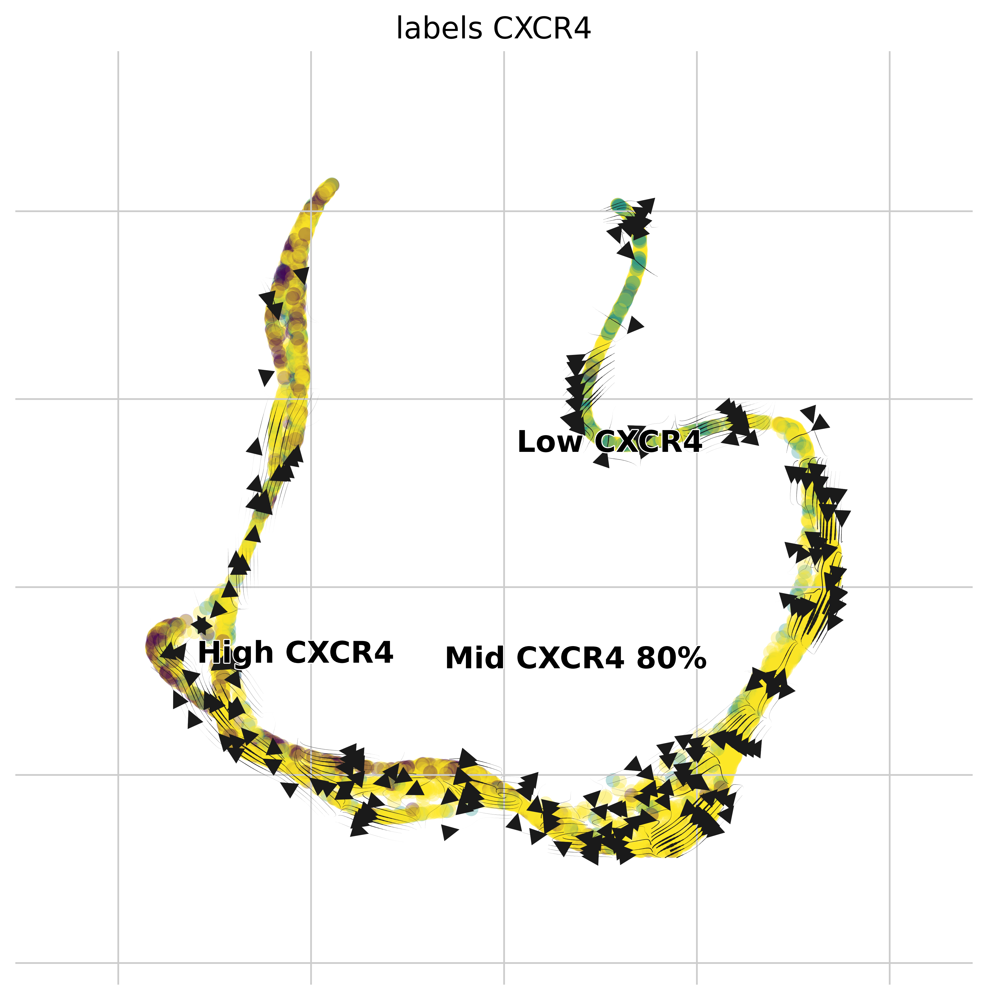

In [331]:
scv.pl.velocity_embedding_stream(adatasubset_loom, basis='draw_graph_fa', color = 'labels_CXCR4', dpi = 300, add_margin = 0.2, figsize = (8,8), arrow_size = 2, density = 6)

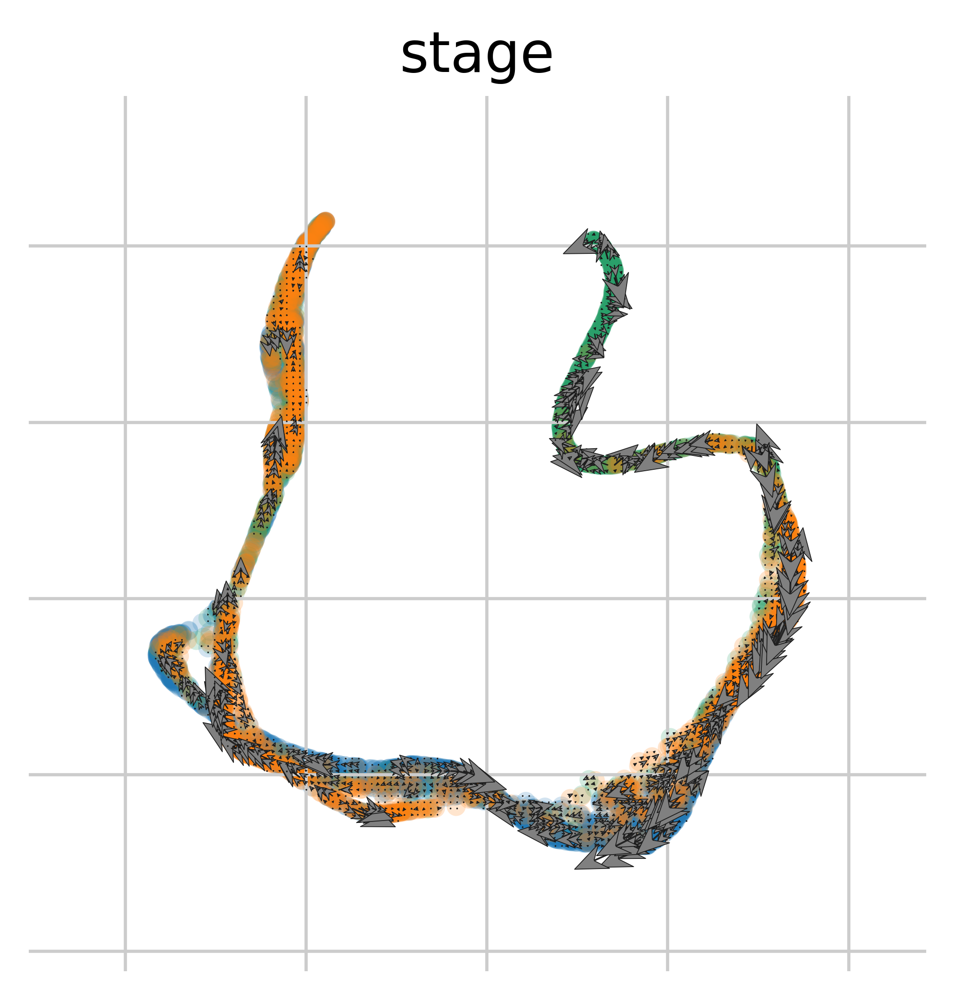

In [333]:
scv.pl.velocity_embedding_grid(adatasubset_loom, basis='draw_graph_fa', color = 'stage', dpi = 300, add_margin = 0.2, figsize = (4,4), arrow_length = 4, arrow_size = 6, density = 2)

In [357]:
adatasubset_CXCR4high = adatasubset_loom[adatasubset_loom.obs['labels_CXCR4'].isin(['High CXCR4'])]

In [358]:
adatasubset_CXCR4low = adatasubset_loom[adatasubset_loom.obs['labels_CXCR4'].isin(['Low CXCR4'])]

In [359]:
adatasubset_CXCR4low.obs

,stage,batch,leiden,GOBP_NEURON_MIGRATION,labels_CXCR4,labels_GOBP_NEURON_MIGR,sample_batch,Clusters,_X,_Y,initial_size_spliced,initial_size_unspliced,initial_size,n_counts,velocity_self_transition
AAACATACTTCCAT,FD59,0,38,0.054293,Low CXCR4,Mid 80%,-1-0,8,16.908585,-6.551699,5,5,5.0,133.729446,0.0
ATAGATTGAACGAA,FD125,2,22,-0.014370,Low CXCR4,Low,-1-2,3,12.207885,10.716097,178,103,178.0,99.779213,1.0
ATAGCGTGAAGGTA,FD125,2,39,0.099349,Low CXCR4,High,-1-2,12,34.053688,30.445448,150,115,150.0,119.474869,0.0
ATAGCTCTTCCAGA,FD125,2,39,0.060912,Low CXCR4,Mid 80%,-1-2,4,9.495163,31.798828,155,119,155.0,106.213013,0.0
ATCCAGGACTAGCA,FD125,2,46,0.027482,Low CXCR4,Mid 80%,-1-2,1,41.664501,-2.040138,172,63,172.0,124.589035,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ATCGGAACTGCATG,FD82,3,35,0.024655,Low CXCR4,Mid 80%,-1-3,4,-11.067795,-30.382250,157,58,157.0,159.702454,0.0
ATCTACTGTGTCTT,FD82,3,24,0.021874,Low CXCR4,Mid 80%,-1-3,5,-17.230848,23.516735,259,19,259.0,140.810730,0.0
ATCTGACTGTGAGG,FD82,3,35,0.068069,Low CXCR4,Mid 80%,-1-3,2,11.715483,-42.213089,54,11,54.0,155.128586,0.0
ATCTGGGATGCAGT,FD82,3,46,0.001487,Low CXCR4,Low,-1-3,8,-1.693071,12.102224,186,88,186.0,126.381882,0.0


In [360]:
adatasubset_CXCR4high.obs

,stage,batch,leiden,GOBP_NEURON_MIGRATION,labels_CXCR4,labels_GOBP_NEURON_MIGR,sample_batch,Clusters,_X,_Y,initial_size_spliced,initial_size_unspliced,initial_size,n_counts,velocity_self_transition
AAACATTGACCTGA,FD59,0,24,0.062152,High CXCR4,Mid 80%,-1-0,7,-3.144438,8.798876,149,45,149.0,145.653503,0.0
AAAGTTTGCTATGG,FD59,0,38,0.045031,High CXCR4,Mid 80%,-1-0,0,-6.972213,22.193338,296,15,296.0,144.812820,0.0
AACACGTGCTGGTA,FD59,0,24,0.082292,High CXCR4,Mid 80%,-1-0,8,-20.745893,28.215536,230,75,230.0,146.283188,0.0
AACGTCGACTGCAA,FD59,0,46,0.012051,High CXCR4,Mid 80%,-1-0,4,-14.719199,-4.837344,214,69,214.0,140.399246,1.0
AACTACCTCAATCG,FD59,0,46,0.009366,High CXCR4,Mid 80%,-1-0,1,-3.306969,-25.777060,201,55,201.0,139.398193,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TGGTTACTGTTGAC,FD82,4,38,0.011967,High CXCR4,Mid 80%,-1-4,5,-8.475560,1.934590,187,36,187.0,133.017410,0.0
TGTGATCTGCCATA,FD82,4,38,0.061009,High CXCR4,Mid 80%,-1-4,5,-14.396152,34.257473,211,33,211.0,131.022232,0.0
TTAGTCTGCGTACA,FD82,4,38,0.059206,High CXCR4,Mid 80%,-1-4,1,-10.754791,-15.356059,205,33,205.0,139.594177,0.0
TTCAGACTCTTACT,FD82,4,34,0.087315,High CXCR4,High,-1-4,3,-2.190053,-0.346835,27,12,27.0,144.176575,0.0


computing velocity embedding
    finished (0:00:00) --> added
    'velocity_draw_graph_fa', embedded velocity vectors (adata.obsm)


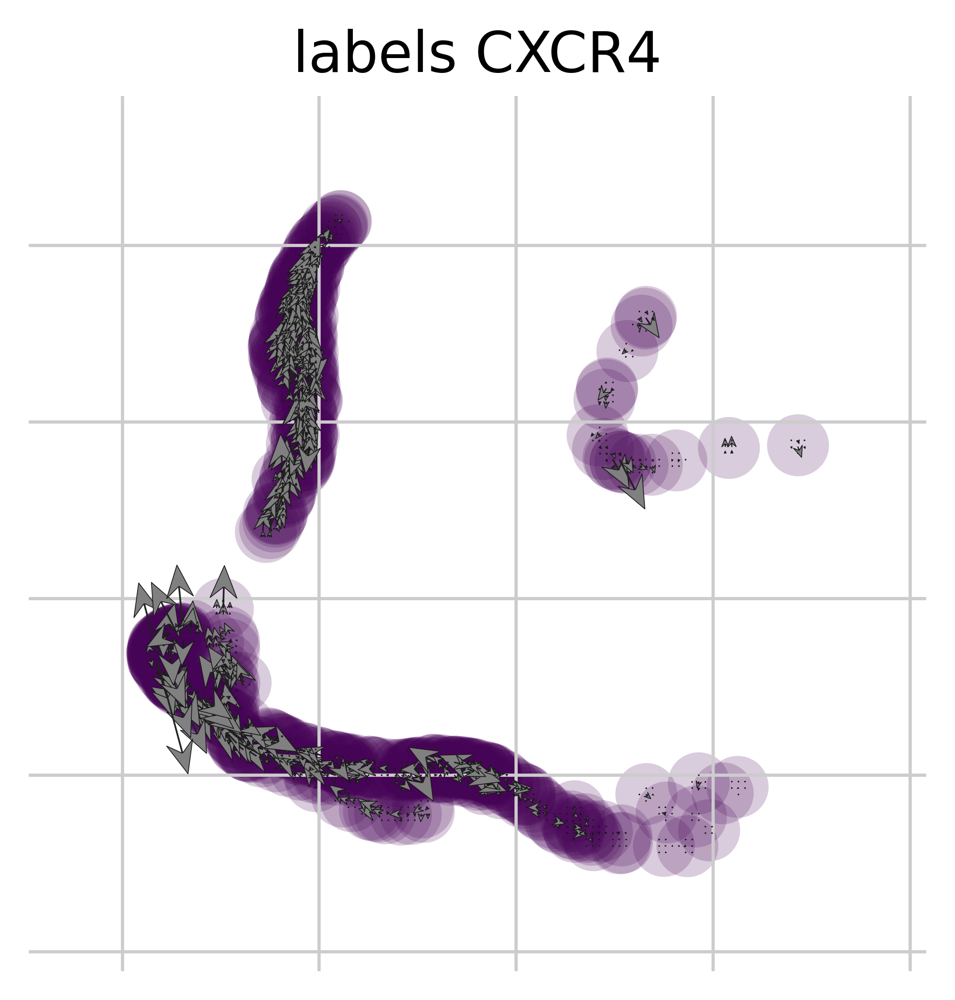

In [367]:
scv.pl.velocity_embedding_grid(adatasubset_CXCR4high, basis='draw_graph_fa', color = 'labels_CXCR4', dpi = 300, add_margin = 0.2, figsize = (4,4), arrow_length = 4, arrow_size = 6, density = 2)

computing velocity embedding
    finished (0:00:00) --> added
    'velocity_draw_graph_fa', embedded velocity vectors (adata.obsm)


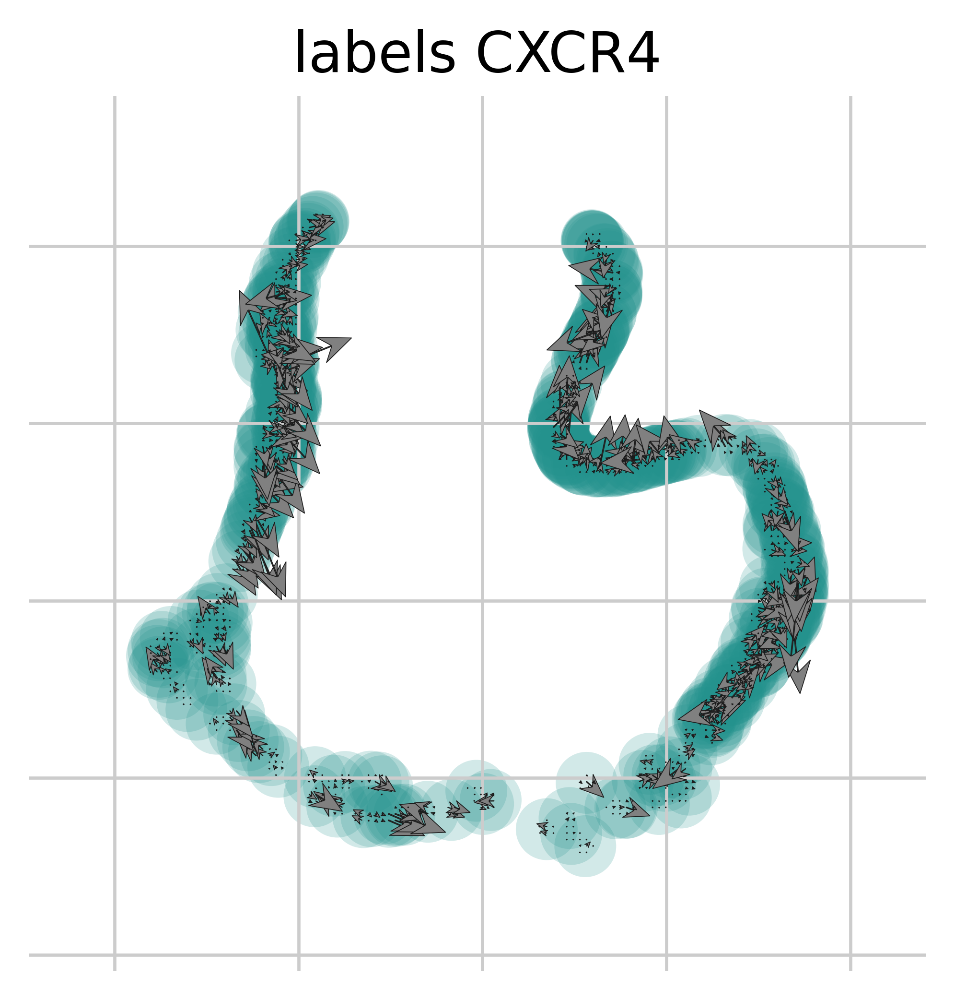

In [368]:
scv.pl.velocity_embedding_grid(adatasubset_CXCR4low, basis='draw_graph_fa', color = 'labels_CXCR4', dpi = 300, add_margin = 0.2, figsize = (4,4), arrow_length = 4, arrow_size = 6, density = 2)

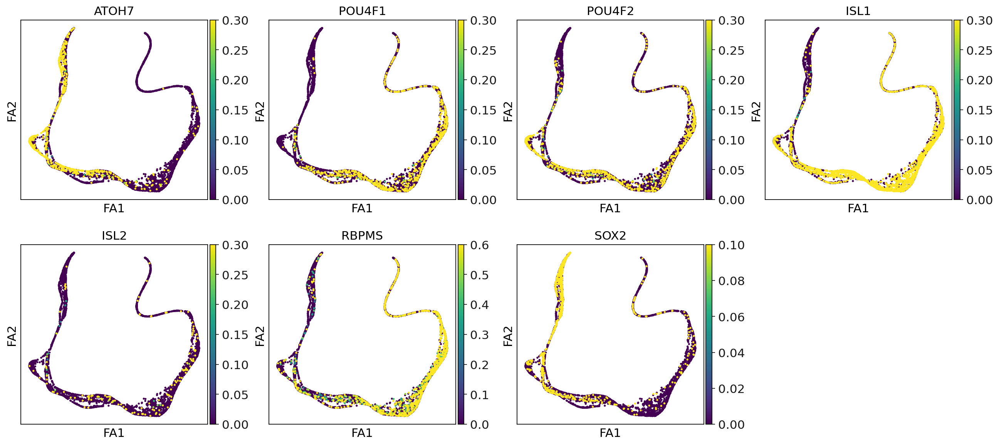

In [370]:
sc.pl.draw_graph(adatasubset,color=['ATOH7','POU4F1','POU4F2','ISL1','ISL2','RBPMS','SOX2'], vmax = [0.3,0.3,0.3,0.3,0.3,0.6,0.1])

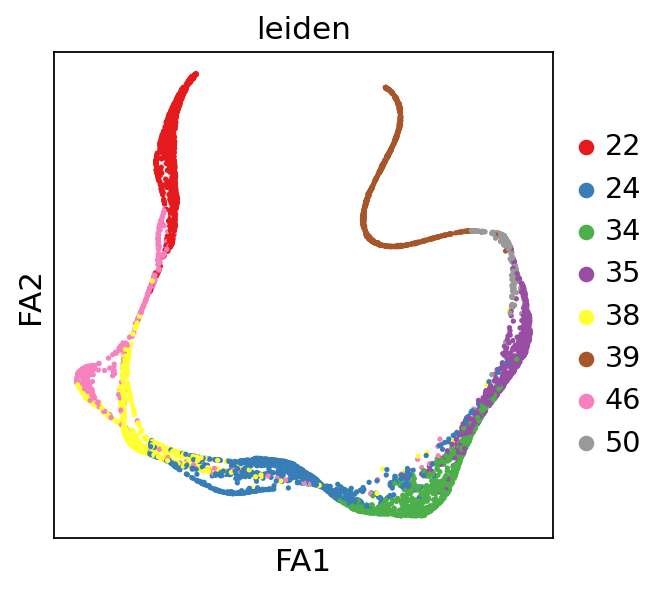

In [371]:
sc.pl.draw_graph(adatasubset, color = 'leiden')

In [372]:
adatasubset_loom_no_progenitors = adatasubset_loom[adatasubset_loom.obs['leiden'].isin(['38','24','34','35','50','39'])]

In [373]:
adatasubset_loom_no_progenitors_reembed = adatasubset_loom_no_progenitors

In [374]:
sc.pp.pca(adatasubset_loom_no_progenitors_reembed)
pca_projections = pd.DataFrame(adatasubset_loom_no_progenitors_reembed.obsm["X_pca"],index=adatasubset_loom_no_progenitors_reembed.obs_names)
dm_res = palantir.utils.run_diffusion_maps(pca_projections)
ms_data = palantir.utils.determine_multiscale_space(dm_res,n_eigs=4)
adatasubset_loom_no_progenitors_reembed.obsm["X_palantir"]=ms_data.values
sc.pp.neighbors(adatasubset_loom_no_progenitors_reembed,n_neighbors=30,use_rep="X_palantir")
adatasubset_loom_no_progenitors_reembed.obsm["X_pca2d"]=adatasubset_loom_no_progenitors_reembed.obsm["X_pca"][:,:2]
sc.tl.draw_graph(adatasubset_loom_no_progenitors_reembed,init_pos='X_pca2d')

computing PCA
    on highly variable genes
    with n_comps=21
    finished (0:00:00)
Determing nearest neighbor graph...
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:01)
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
drawing single-cell graph using layout 'fa'
    finished: added
    'X_draw_graph_fa', graph_drawing coordinates (adata.obsm) (0:00:25)


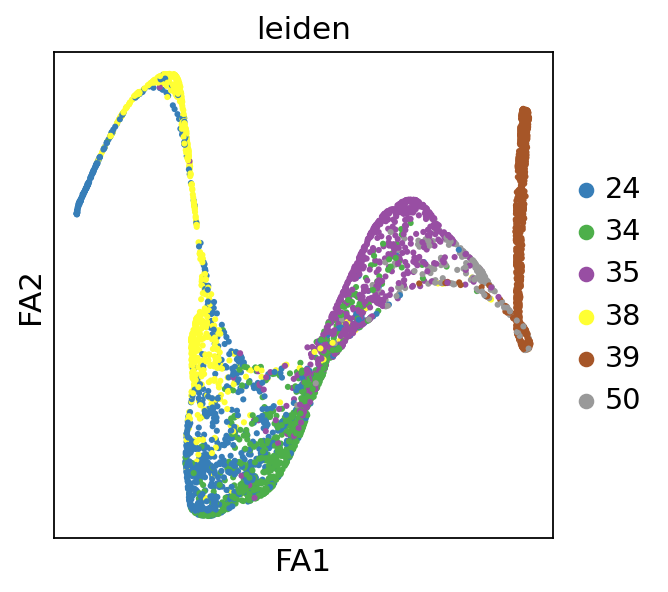

In [375]:
sc.pl.draw_graph(adatasubset_loom_no_progenitors_reembed, color = 'leiden')

In [377]:
adatasubset_loom_no_progenitors_reembed

AnnData object with n_obs × n_vars = 3931 × 89
    obs: 'stage', 'batch', 'leiden', 'GOBP_NEURON_MIGRATION', 'labels_CXCR4', 'labels_GOBP_NEURON_MIGR', 'sample_batch', 'Clusters', '_X', '_Y', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size', 'n_counts', 'velocity_self_transition'
    var: 'gene_ids', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'velocity_gamma', 'velocity_qreg_ratio', 'velocity_r2', 'velocity_genes'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'draw_graph', 'stage_colors', 'leiden', 'leiden_colors', 'labels_CXCR4_colors', 'rank_genes_groups', 'labels_GOBP_NEURON_MIGR_colors', 'umap', 'tsne', 'velocity_params', 'velocity_graph', 'velocity_graph_neg'
    obsm: 'X_pca', 'X_palantir', 'X_pca2d', 'X_draw_graph_fa', 'X_umap', 'X_tsne', 'velocity_draw_graph_fa'
    varm: 'PCs'
    layers: 'matrix', 'ambiguous', 'spliced', 'unspliced', 'Ms', 'Mu', 'velocity', 'variance_velocity'
 

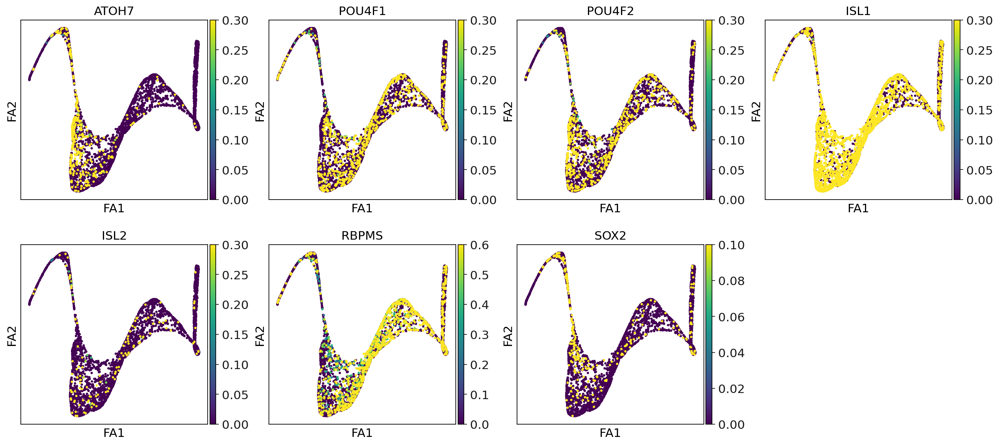

In [378]:
sc.pl.draw_graph(adatasubset_loom_no_progenitors_reembed,color=['ATOH7','POU4F1','POU4F2','ISL1','ISL2','RBPMS','SOX2'], vmax = [0.3,0.3,0.3,0.3,0.3,0.6,0.1])

In [379]:
sc.tl.leiden(adatasubset_loom_no_progenitors_reembed)

running Leiden clustering
    finished: found 22 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


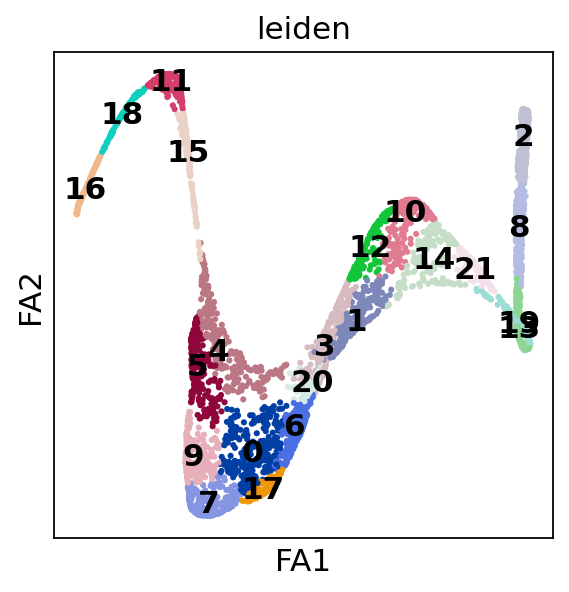

In [381]:
sc.pl.draw_graph(adatasubset_loom_no_progenitors_reembed, color = 'leiden', legend_loc = 'on data')

In [382]:
adatasubset_loom_no_progenitors_reembed = adatasubset_loom_no_progenitors_reembed[adatasubset_loom_no_progenitors_reembed.obs['leiden'].isin(['15','5','4','9','0','7','17','6','20','3','1','12','10','14','21','19','13','8','2'])]

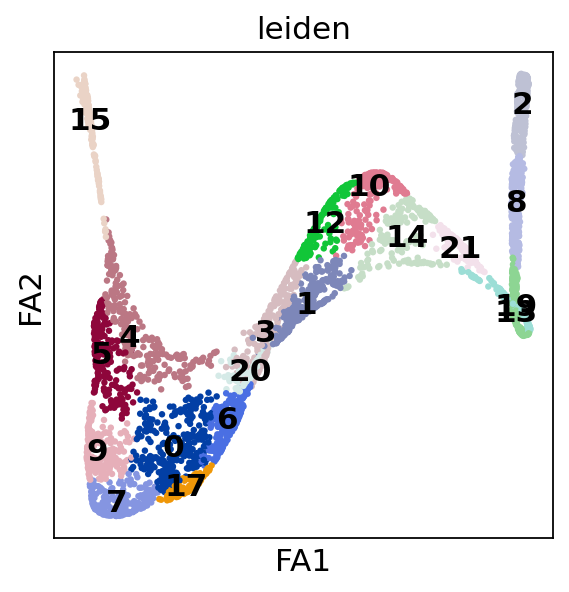

In [383]:
sc.pl.draw_graph(adatasubset_loom_no_progenitors_reembed, color = 'leiden', legend_loc = 'on data')

In [384]:
sc.pp.pca(adatasubset_loom_no_progenitors_reembed)
pca_projections = pd.DataFrame(adatasubset_loom_no_progenitors_reembed.obsm["X_pca"],index=adatasubset_loom_no_progenitors_reembed.obs_names)
dm_res = palantir.utils.run_diffusion_maps(pca_projections)
ms_data = palantir.utils.determine_multiscale_space(dm_res,n_eigs=4)
adatasubset_loom_no_progenitors_reembed.obsm["X_palantir"]=ms_data.values
sc.pp.neighbors(adatasubset_loom_no_progenitors_reembed,n_neighbors=30,use_rep="X_palantir")
adatasubset_loom_no_progenitors_reembed.obsm["X_pca2d"]=adatasubset_loom_no_progenitors_reembed.obsm["X_pca"][:,:2]
sc.tl.draw_graph(adatasubset_loom_no_progenitors_reembed,init_pos='X_pca2d')

computing PCA
    on highly variable genes
    with n_comps=21
    finished (0:00:00)
Determing nearest neighbor graph...
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
drawing single-cell graph using layout 'fa'
    finished: added
    'X_draw_graph_fa', graph_drawing coordinates (adata.obsm) (0:00:23)


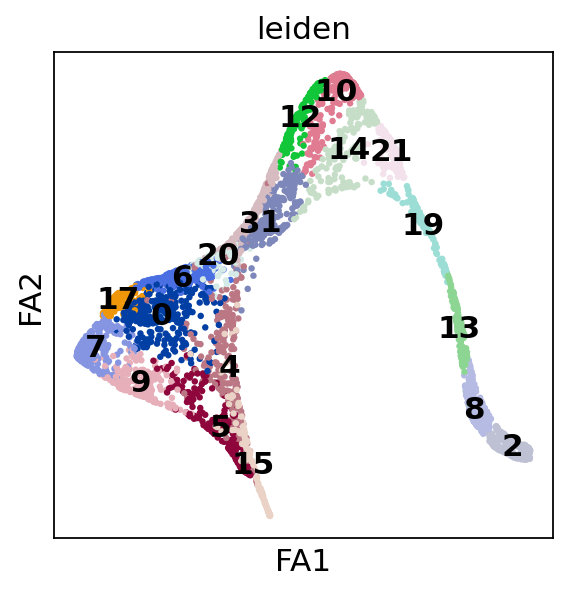

In [387]:
sc.pl.draw_graph(adatasubset_loom_no_progenitors_reembed, color = 'leiden', legend_loc = 'on data')

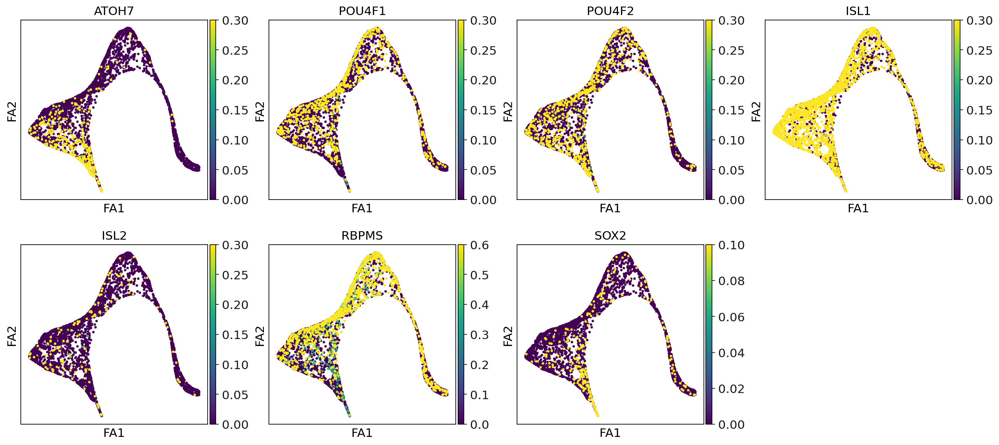

In [386]:
sc.pl.draw_graph(adatasubset_loom_no_progenitors_reembed,color=['ATOH7','POU4F1','POU4F2','ISL1','ISL2','RBPMS','SOX2'], vmax = [0.3,0.3,0.3,0.3,0.3,0.6,0.1])

In [388]:
adatasubset_loom_no_progenitors_reembed = adatasubset_loom_no_progenitors_reembed[adatasubset_loom_no_progenitors_reembed.obs['leiden'].isin(['15','5','4','9','0','7','17','6','20','3','1','12','10','14','21'])]

In [399]:
sc.pp.pca(adatasubset_loom_no_progenitors_reembed)
pca_projections = pd.DataFrame(adatasubset_loom_no_progenitors_reembed.obsm["X_pca"],index=adatasubset_loom_no_progenitors_reembed.obs_names)
dm_res = palantir.utils.run_diffusion_maps(pca_projections)
ms_data = palantir.utils.determine_multiscale_space(dm_res,n_eigs=4)
adatasubset_loom_no_progenitors_reembed.obsm["X_palantir"]=ms_data.values
sc.pp.neighbors(adatasubset_loom_no_progenitors_reembed,n_neighbors=50,use_rep="X_palantir")
adatasubset_loom_no_progenitors_reembed.obsm["X_pca2d"]=adatasubset_loom_no_progenitors_reembed.obsm["X_pca"][:,:2]
sc.tl.draw_graph(adatasubset_loom_no_progenitors_reembed,init_pos='X_pca2d')

computing PCA
    on highly variable genes
    with n_comps=11
    finished (0:00:00)
Determing nearest neighbor graph...
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
drawing single-cell graph using layout 'fa'
    finished: added
    'X_draw_graph_fa', graph_drawing coordinates (adata.obsm) (0:00:20)


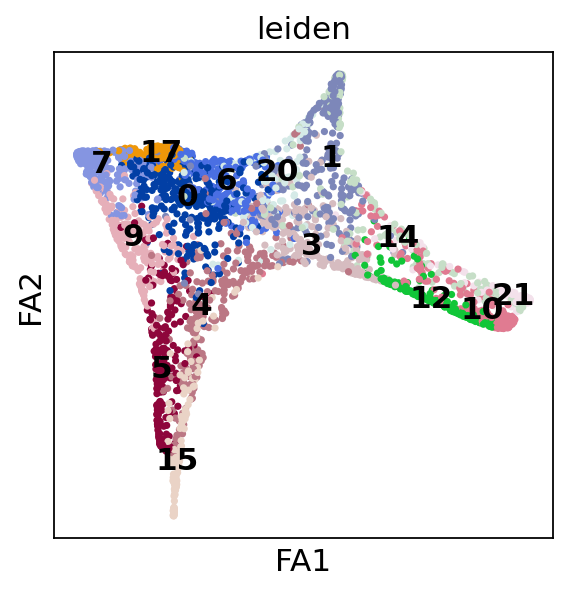

In [400]:
sc.pl.draw_graph(adatasubset_loom_no_progenitors_reembed, color = 'leiden', legend_loc = 'on data')

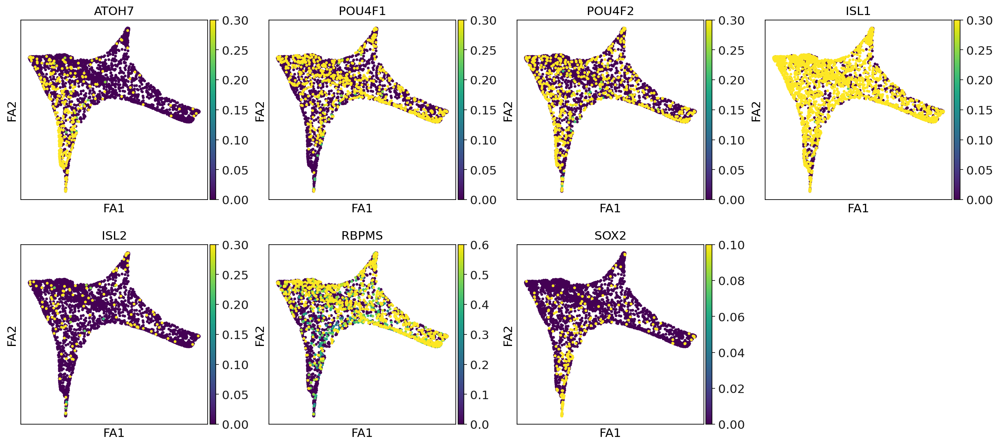

In [401]:
sc.pl.draw_graph(adatasubset_loom_no_progenitors_reembed,color=['ATOH7','POU4F1','POU4F2','ISL1','ISL2','RBPMS','SOX2'], vmax = [0.3,0.3,0.3,0.3,0.3,0.6,0.1])

In [402]:
adatasubset_loom_no_progenitors_reembed = adatasubset_loom_no_progenitors_reembed[adatasubset_loom_no_progenitors_reembed.obs['leiden'].isin(['5','4','9','0','7','17','6','20','3','1','12','10','14','21'])]

In [403]:
sc.pp.pca(adatasubset_loom_no_progenitors_reembed)
pca_projections = pd.DataFrame(adatasubset_loom_no_progenitors_reembed.obsm["X_pca"],index=adatasubset_loom_no_progenitors_reembed.obs_names)
dm_res = palantir.utils.run_diffusion_maps(pca_projections)
ms_data = palantir.utils.determine_multiscale_space(dm_res,n_eigs=4)
adatasubset_loom_no_progenitors_reembed.obsm["X_palantir"]=ms_data.values
sc.pp.neighbors(adatasubset_loom_no_progenitors_reembed,n_neighbors=50,use_rep="X_palantir")
adatasubset_loom_no_progenitors_reembed.obsm["X_pca2d"]=adatasubset_loom_no_progenitors_reembed.obsm["X_pca"][:,:2]
sc.tl.draw_graph(adatasubset_loom_no_progenitors_reembed,init_pos='X_pca2d')

computing PCA
    on highly variable genes
    with n_comps=11
    finished (0:00:00)
Determing nearest neighbor graph...
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
drawing single-cell graph using layout 'fa'
    finished: added
    'X_draw_graph_fa', graph_drawing coordinates (adata.obsm) (0:00:18)


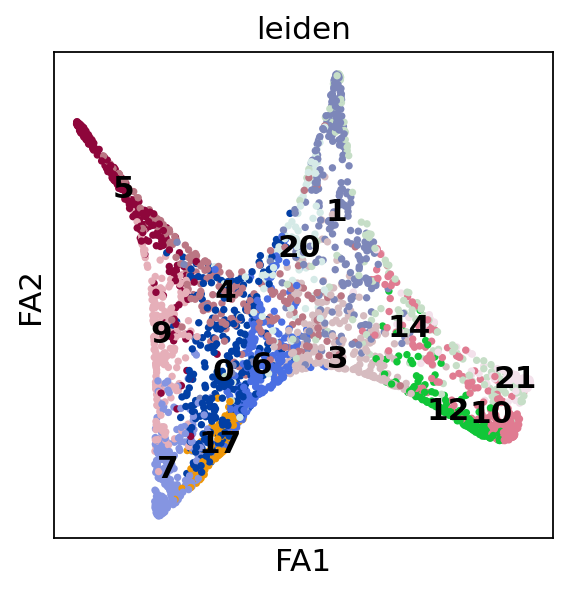

In [404]:
sc.pl.draw_graph(adatasubset_loom_no_progenitors_reembed, color = 'leiden', legend_loc = 'on data')

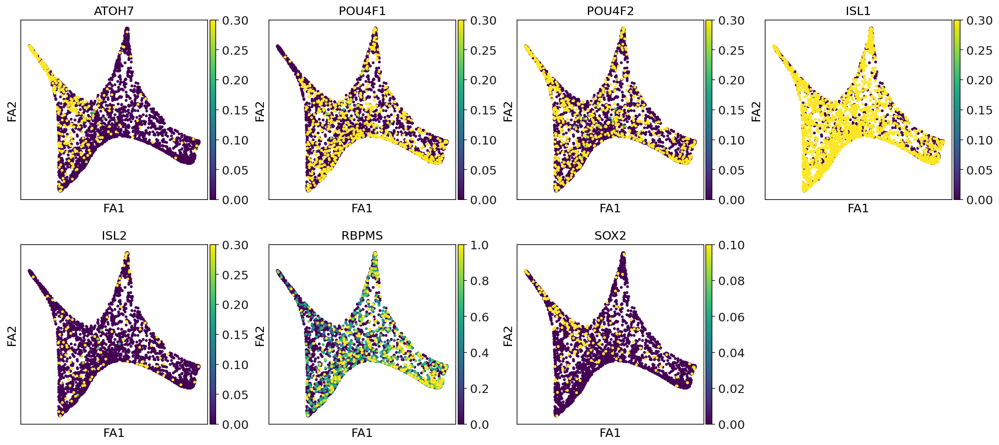

In [415]:
sc.pl.draw_graph(adatasubset_loom_no_progenitors_reembed,color=['ATOH7','POU4F1','POU4F2','ISL1','ISL2','RBPMS','SOX2'], vmax = [0.3,0.3,0.3,0.3,0.3,1,0.1])

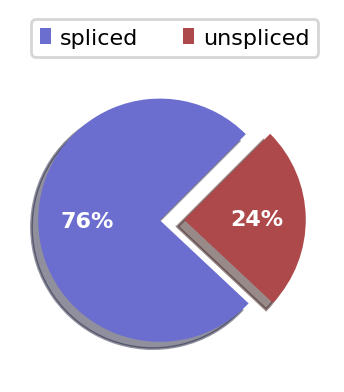

In [406]:
scv.pl.proportions(adatasubset_loom_no_progenitors_reembed)

In [407]:
scv.pp.filter_and_normalize(adatasubset_loom_no_progenitors_reembed, min_shared_counts=20, n_top_genes=2000)
scv.pp.moments(adatasubset_loom_no_progenitors_reembed, n_pcs=30, n_neighbors=30)

Filtered out 1 genes that are detected 20 counts (shared).
Skip filtering by dispersion since number of variables are less than `n_top_genes`.
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


In [408]:
scv.tl.velocity(adatasubset_loom_no_progenitors_reembed)

computing velocities
    finished (0:00:00) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)


In [409]:
scv.pp.neighbors(adatasubset_loom_no_progenitors_reembed)

computing neighbors
    finished (0:00:00) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)


In [410]:
scv.tl.velocity_graph(adatasubset_loom_no_progenitors_reembed)

computing velocity graph (using 1/12 cores)


  0%|          | 0/2715 [00:00<?, ?cells/s]

    finished (0:00:03) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


computing velocity embedding
    finished (0:00:00) --> added
    'velocity_draw_graph_fa', embedded velocity vectors (adata.obsm)


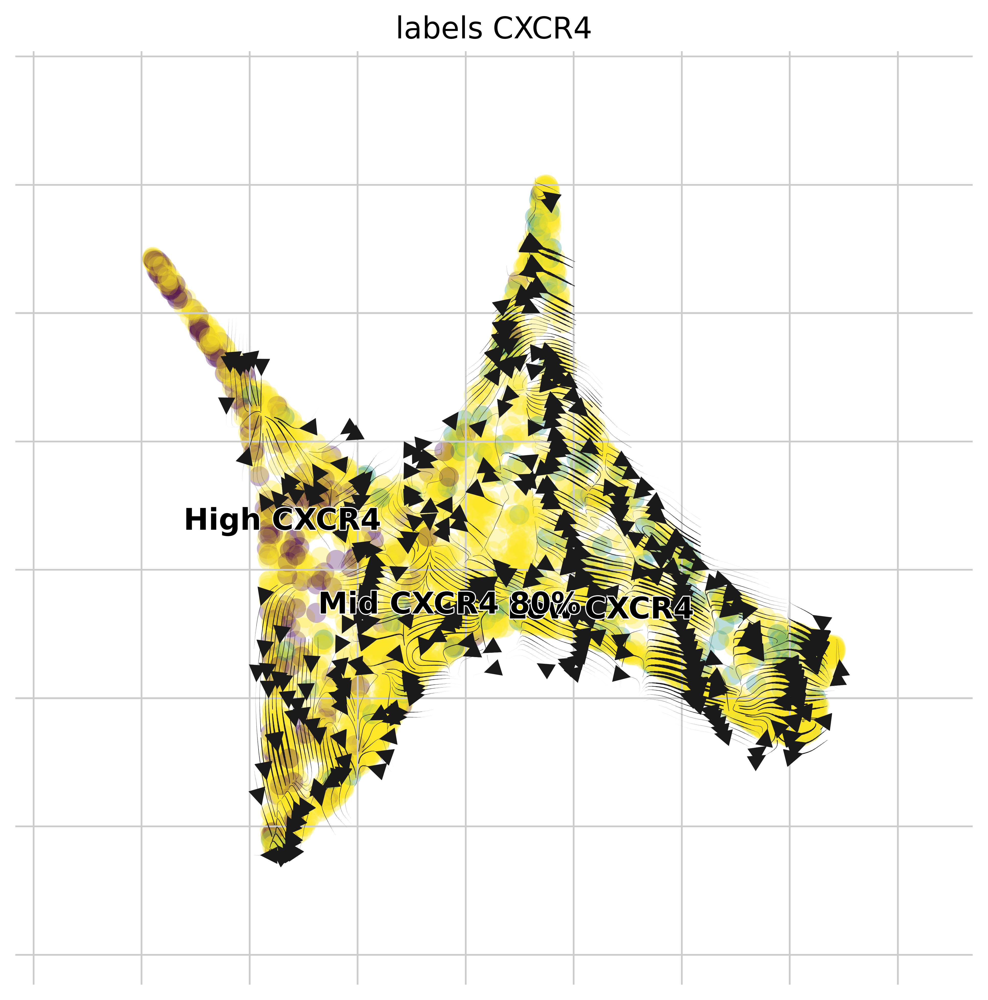

In [411]:
scv.pl.velocity_embedding_stream(adatasubset_loom_no_progenitors_reembed, basis='draw_graph_fa', color = 'labels_CXCR4', dpi = 300, add_margin = 0.2, figsize = (8,8), arrow_size = 2, density = 6)

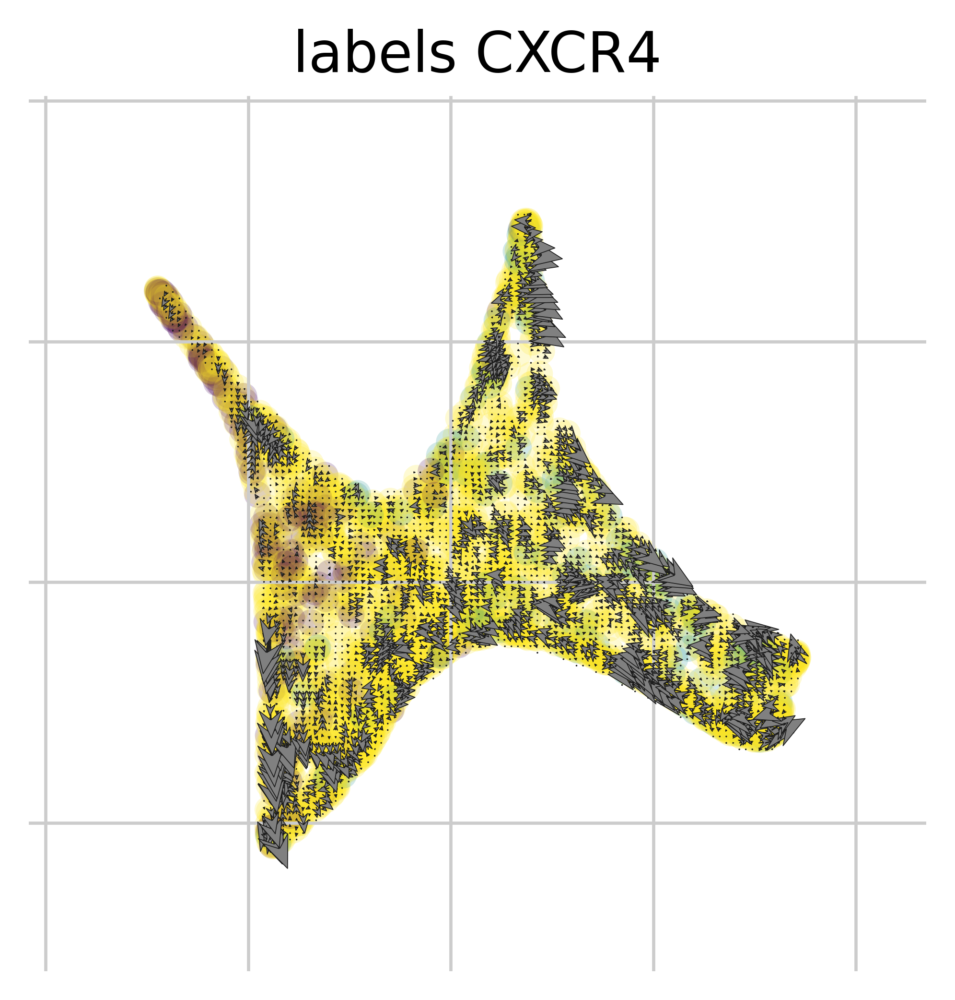

In [412]:
scv.pl.velocity_embedding_grid(adatasubset_loom_no_progenitors_reembed, basis='draw_graph_fa', color = 'labels_CXCR4', dpi = 300, add_margin = 0.2, figsize = (4,4), arrow_length = 4, arrow_size = 6, density = 2)

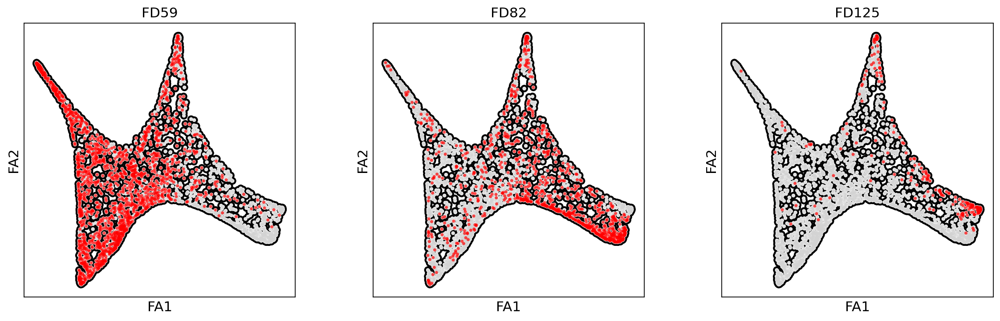

In [413]:
cluster_small_multiples_cartoon(adatasubset_loom_no_progenitors_reembed, clust_key = 'stage', palette = ['Red'])